In [1]:
import pickle
import s3fs
from dotenv import load_dotenv
import pandas as pd
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(rc={'patch.linewidth': 0.1})

load_dotenv()

def load_asset(asset_name:str) -> pd.DataFrame|gpd.GeoDataFrame:
    s3 = s3fs.S3FileSystem(endpoint_url='http://localhost:9000/')
    with s3.open(f'bronze-db/dagster/{asset_name}', 'rb') as f:
        obj = pickle.load(f)
    if isinstance(obj, gpd.GeoDataFrame):
        obj = obj.set_crs(epsg=31983)
    return obj

In [2]:
%matplotlib inline

Primeiro eu carrego os dados direto do bucket do dagster

In [3]:
s3fs.S3FileSystem(endpoint_url='http://localhost:9000/').ls('bronze-db/dagster')

['bronze-db/dagster/Basico_SP1',
 'bronze-db/dagster/Domicilio01_SP1',
 'bronze-db/dagster/GEOSAMPA_cadparcs_area_protecao_apa',
 'bronze-db/dagster/GEOSAMPA_cadparcs_parque_estadual',
 'bronze-db/dagster/GEOSAMPA_cadparcs_parque_outra_secretaria',
 'bronze-db/dagster/GEOSAMPA_cadparcs_reserva_particular_natural',
 'bronze-db/dagster/GEOSAMPA_cadparcs_unidade_conservacao_existente',
 'bronze-db/dagster/GEOSAMPA_terra_indigena',
 'bronze-db/dagster/area_contaminada_reabilitada_svma',
 'bronze-db/dagster/area_inundavel',
 'bronze-db/dagster/area_risco_geologico',
 'bronze-db/dagster/arquivo_zip_censo',
 'bronze-db/dagster/basico_digest',
 'bronze-db/dagster/distrito_municipal',
 'bronze-db/dagster/domicilio01_digest',
 'bronze-db/dagster/manancial_billings',
 'bronze-db/dagster/manancial_guarapiranga',
 'bronze-db/dagster/manancial_juquery',
 'bronze-db/dagster/operacao_urbana',
 'bronze-db/dagster/patrimonio_cultural_area_envoltoria_CONDEPHAAT',
 'bronze-db/dagster/patrimonio_cultural_a

In [4]:
df = load_asset('domicilio01_digest')
df

,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,V007,V008,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
0,355030801000001,1,268.0,266.0,203.0,20.0,11.0,136.0,7.0,116.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,355030801000002,1,306.0,306.0,298.0,8.0,0.0,194.0,10.0,85.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,355030801000003,1,189.0,189.0,177.0,1.0,7.0,135.0,1.0,50.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,355030801000004,1,181.0,181.0,154.0,4.0,23.0,76.0,2.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,355030801000005,1,240.0,240.0,226.0,1.0,12.0,105.0,4.0,112.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,355030896000243,1,96.0,96.0,96.0,0.0,0.0,4.0,0.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18359,355030896000244,1,54.0,54.0,54.0,0.0,0.0,17.0,0.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18360,355030896000245,1,87.0,87.0,87.0,0.0,0.0,75.0,0.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18361,355030896000246,1,38.0,38.0,38.0,0.0,0.0,34.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
gdf = load_asset('setor_censitario_2010')
gdf = gdf.set_crs(epsg=31983)
gdf

,geometry,cd_identificador,cd_identificador_georreferenciamento,qt_area_setor_censitario,cd_original_setor_censitario,an_censo_demografico
0,"POLYGON ((313583.672 7410283.924, 313590.068 7...",13474,None,3.110952e+05,355030803000062,2010
1,"POLYGON ((313583.672 7410283.924, 313626.776 7...",13475,None,4.995356e+04,355030803000069,2010
2,"POLYGON ((313580.990 7410657.602, 313604.793 7...",13476,None,2.386213e+05,355030803000063,2010
3,"POLYGON ((314069.930 7411007.140, 314082.788 7...",13477,None,6.912969e+06,355030803000049,2010
4,"POLYGON ((317840.068 7410696.346, 317839.386 7...",13478,None,8.124442e+04,355030803000072,2010
...,...,...,...,...,...,...
18970,"POLYGON ((341882.498 7388836.793, 341870.623 7...",32444,None,1.373031e+04,355030872000083,2010
18971,"POLYGON ((341990.439 7389047.720, 342013.022 7...",32445,None,1.178958e+04,355030872000080,2010
18972,"POLYGON ((342078.578 7389013.788, 342092.866 7...",32446,None,1.175459e+04,355030872000078,2010
18973,"POLYGON ((346244.092 7397737.566, 346258.896 7...",32447,None,1.040195e+03,355030859000201,2010


In [6]:
df.dtypes

Cod_setor          object
Situacao_setor      int64
V001              float64
V002              float64
V003              float64
                   ...   
V237              float64
V238              float64
V239              float64
V240              float64
V241              float64
Length: 243, dtype: object

In [7]:
gdf.dtypes

geometry                                geometry
cd_identificador                          object
cd_identificador_georreferenciamento      object
qt_area_setor_censitario                 float64
cd_original_setor_censitario              object
an_censo_demografico                       int64
dtype: object

In [8]:
assert df['Cod_setor'].dtype == gdf['cd_original_setor_censitario'].dtype

Confiro a quantidade de códigos em cada dataframe

In [9]:
len(df['Cod_setor'].unique())

18363

In [10]:
len(gdf['cd_original_setor_censitario'].unique())

18953

Os dados do geosampa parecem ter várias linhas com o código do setor duplicado, vamos investigar mais a fundo

In [11]:
apenas_duplicados = ~gdf['cd_original_setor_censitario'].isin(gdf['cd_original_setor_censitario'].drop_duplicates(keep=False))
apenas_duplicados

0        False
1        False
2        False
3        False
4        False
         ...  
18970    False
18971    False
18972    False
18973    False
18974    False
Name: cd_original_setor_censitario, Length: 18975, dtype: bool

In [12]:
dup = gdf.loc[apenas_duplicados].reset_index(drop=True)
dup

,geometry,cd_identificador,cd_identificador_georreferenciamento,qt_area_setor_censitario,cd_original_setor_censitario,an_censo_demografico
0,"POLYGON ((353936.533 7385040.697, 353941.951 7...",13649,None,5.887984e+05,355030875000145,2010
1,"POLYGON ((353067.634 7385855.017, 353076.076 7...",13650,None,5.887984e+05,355030875000145,2010
2,"POLYGON ((317166.055 7390961.494, 317122.635 7...",13924,None,2.300656e+04,355030865000053,2010
3,"POLYGON ((317166.055 7390961.494, 317168.333 7...",13925,None,2.300656e+04,355030865000053,2010
4,"POLYGON ((350557.668 7385114.757, 350724.583 7...",14469,None,1.485398e+05,355030875000065,2010
5,"POLYGON ((350557.668 7385114.757, 350528.469 7...",14470,None,1.485398e+05,355030875000065,2010
6,"POLYGON ((318750.699 7391814.715, 318754.035 7...",15148,None,2.715481e+05,355030867000208,2010
7,"POLYGON ((318809.546 7391465.438, 318807.623 7...",15149,None,2.715481e+05,355030867000208,2010
8,"POLYGON ((352087.492 7385665.922, 352085.422 7...",15905,None,2.017386e+04,355030875000161,2010
9,"POLYGON ((352043.959 7386054.638, 352034.661 7...",15906,None,2.017386e+04,355030875000161,2010


In [13]:
dup == dup.shift(1)

,geometry,cd_identificador,cd_identificador_georreferenciamento,qt_area_setor_censitario,cd_original_setor_censitario,an_censo_demografico
0,False,False,False,False,False,False
1,False,False,False,True,True,True
2,False,False,False,False,False,True
3,False,False,False,True,True,True
4,False,False,False,False,False,True
5,False,False,False,True,True,True
6,False,False,False,False,False,True
7,False,False,False,True,True,True
8,False,False,False,False,False,True
9,False,False,False,True,True,True


As linhas duplicadas sempre tem o polígono diferente, vamos comparar algumas

<Axes: >

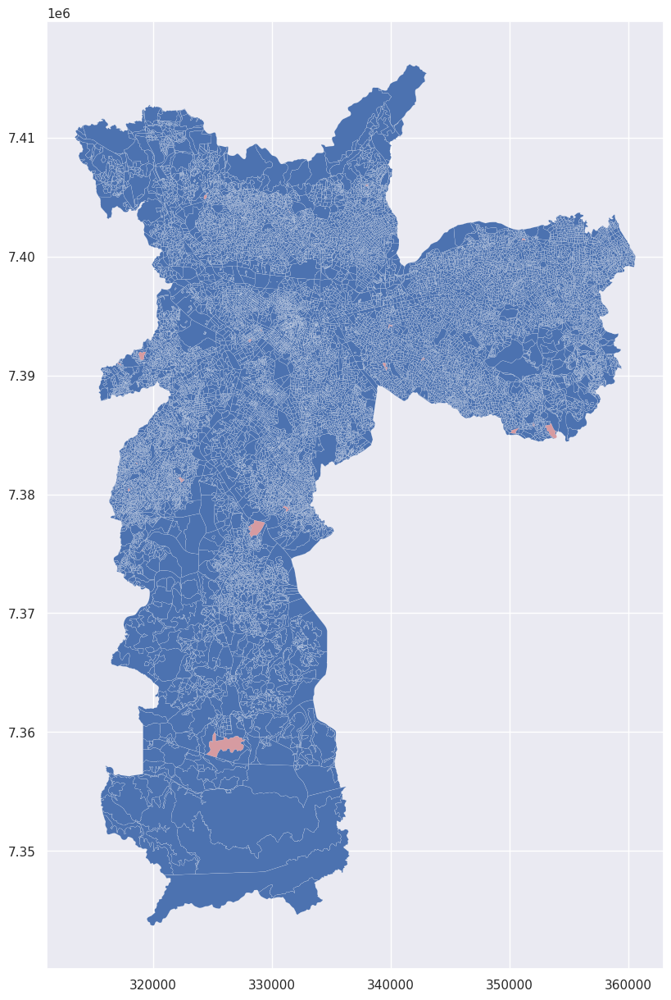

In [14]:
ax = gdf[~apenas_duplicados].plot(figsize=(30, 15))
dup.plot(ax=ax, color='r', alpha=0.5)

/home/d855395/jupyter_env/lib/python3.10/site-packages/geopandas/plotting.py:684: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


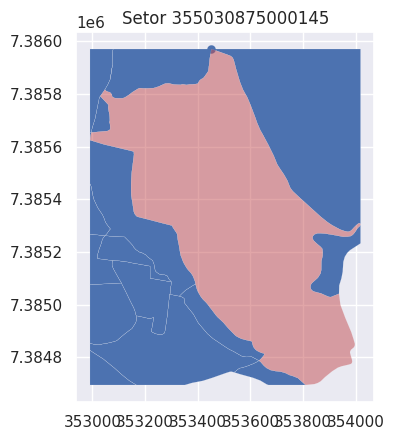

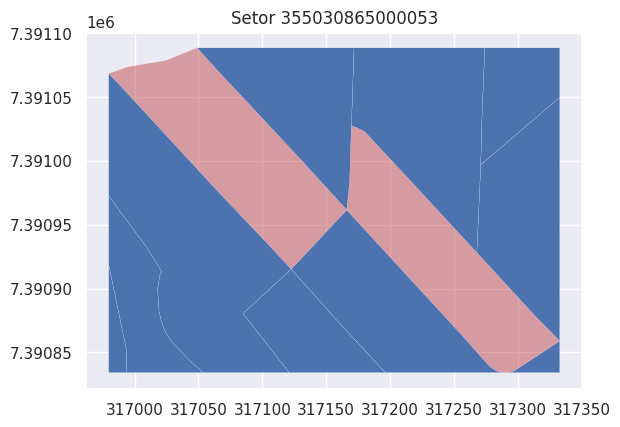

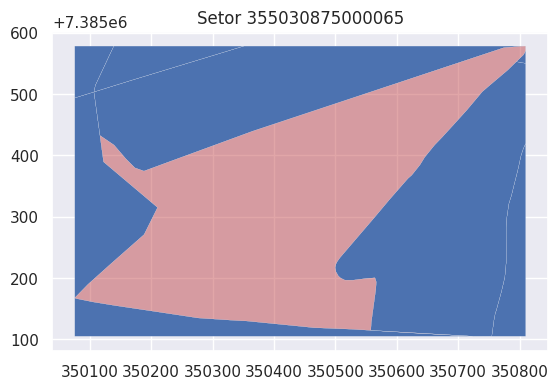

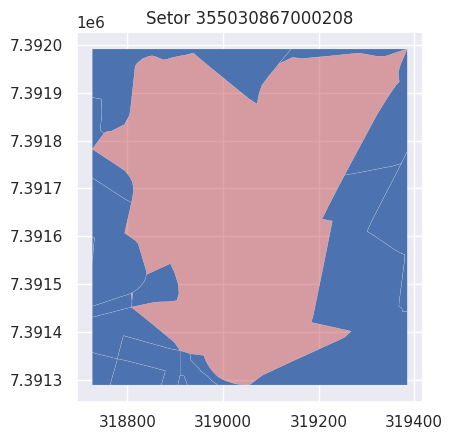

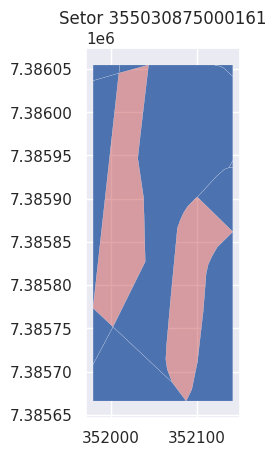

...

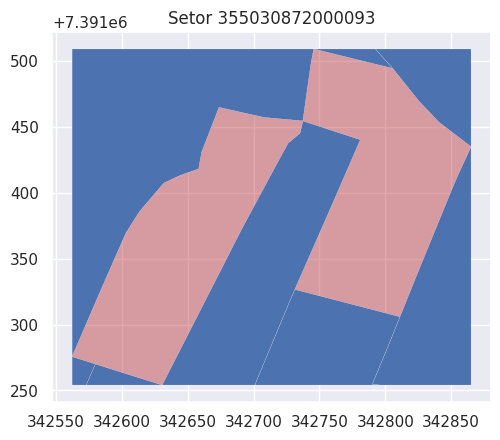

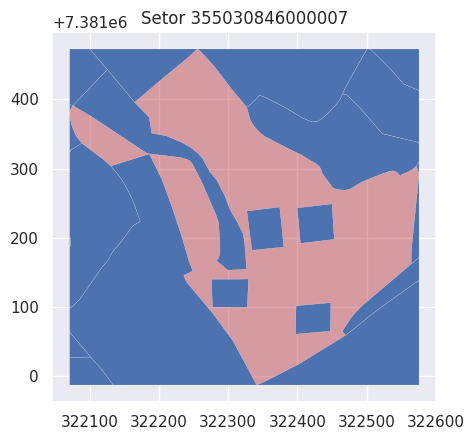

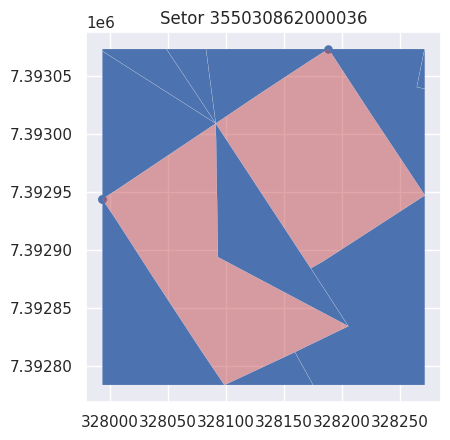

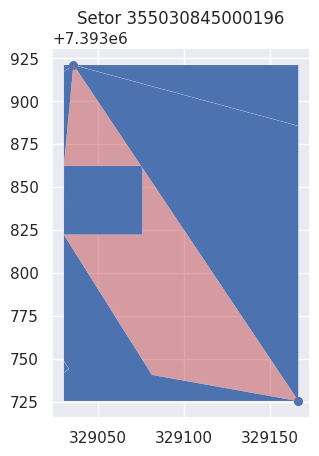

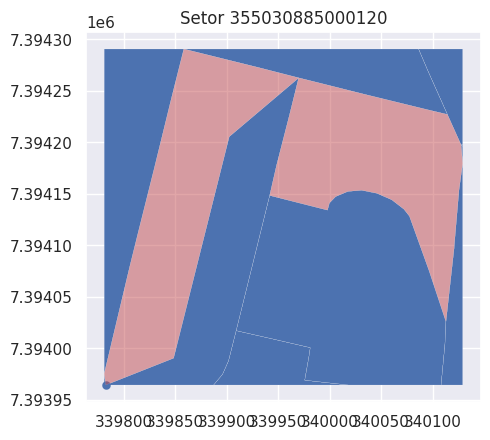

In [15]:
from shapely.geometry import box

for setor in dup['cd_original_setor_censitario'].unique():
    filtered = dup.loc[dup['cd_original_setor_censitario']==setor]
    bbox = box(*filtered.total_bounds)
    clipped = gpd.clip(gdf[~apenas_duplicados], mask=bbox)
    dup_clipped = gpd.clip(dup, mask=bbox)
    ax = clipped.plot()
    ax.set_title(f'Setor {setor}')
    dup_clipped.plot(color='r', ax=ax, alpha=0.5)

Aparentemente não ocorre sobreposição entre os duplicados e os não duplicados, mas alguns setores parecen estranhos por terem polígonos separados entre si e contidos em outros setores. De todo modo, a solução deve ser a agregação dessas linhas com a união dos polígonos de cada setor (para deixar o dataset final com apenas uma linha por setor).

De todo modo, usando left join deve gerar, no máximo, linhas duplicadas. Vou seguir assim num primeiro momento.

In [16]:
dup.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - between 48°W and 42°W, northern and southern hemispheres, onshore and offshore.
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: title={'center': 'Distribuição das distâncias (em metros)'}, ylabel='Frequency'>

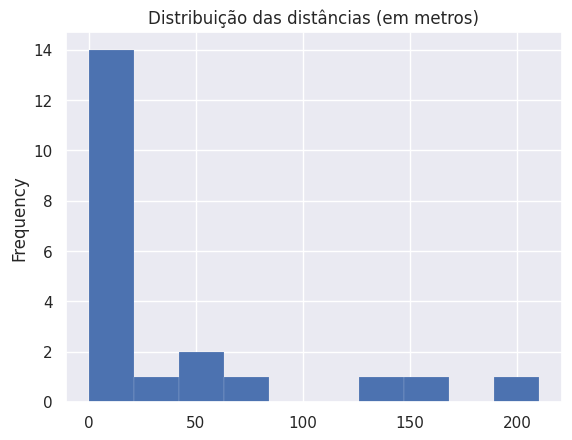

In [17]:
dists_max = []
for setor in dup['cd_original_setor_censitario'].unique():
    tmp = dup[dup['cd_original_setor_censitario']==setor].reset_index(drop=True)
    tmp2 = tmp.loc[::-1].reset_index(drop=True)
    dists  = tmp.geometry.distance(tmp2.geometry)
    dists_max.append(dists.max())


pd.Series(dists_max).plot.hist(title='Distribuição das distâncias (em metros)')

In [18]:
gdf_dissolved = gdf.dissolve(by='cd_original_setor_censitario', as_index=False)[['cd_original_setor_censitario', 'geometry']].copy()
gdf_dissolved

,cd_original_setor_censitario,geometry
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7..."
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7..."
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7..."
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7..."
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7..."
...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7..."
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7..."
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7..."
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7..."


In [19]:
gdf2 = gdf_dissolved.merge(df, how='left', left_on='cd_original_setor_censitario', right_on='Cod_setor')
gdf2

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...",355030801000001,1.0,268.0,266.0,203.0,20.0,11.0,136.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...",355030801000002,1.0,306.0,306.0,298.0,8.0,0.0,194.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...",355030801000003,1.0,189.0,189.0,177.0,1.0,7.0,135.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...",355030801000004,1.0,181.0,181.0,154.0,4.0,23.0,76.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...",355030801000005,1.0,240.0,240.0,226.0,1.0,12.0,105.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...",355030896000243,1.0,96.0,96.0,96.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7...",355030896000244,1.0,54.0,54.0,54.0,0.0,0.0,17.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7...",355030896000245,1.0,87.0,87.0,87.0,0.0,0.0,75.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7...",355030896000246,1.0,38.0,38.0,38.0,0.0,0.0,34.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Algumas linhas do geosampa não tiveram equivalência no arquivo do censo. Vamos avaliar

In [20]:
setores_faltantes = gdf2['Cod_setor'].isna()
gdf2[setores_faltantes]

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
161,355030802000032,"POLYGON ((326922.960 7394938.405, 326964.227 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
270,355030803000062,"POLYGON ((313583.672 7410283.924, 313590.068 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
271,355030803000063,"POLYGON ((313580.990 7410657.602, 313604.793 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
272,355030803000064,"POLYGON ((315616.685 7408121.856, 315616.613 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
273,355030803000065,"POLYGON ((316296.173 7408449.009, 316300.869 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18541,355030894000231,"POLYGON ((322942.803 7387317.853, 322925.477 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18575,355030894000265,"POLYGON ((323302.691 7387880.334, 323262.594 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18592,355030895000012,"POLYGON ((320821.536 7400279.819, 320820.450 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18671,355030895000091,"POLYGON ((322894.320 7400080.699, 322914.209 7...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df[df['Cod_setor'].str.contains('35503080300006')]

,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,V007,V008,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
267,355030803000060,1,114.0,114.0,114.0,0.0,0.0,84.0,10.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
268,355030803000061,4,394.0,394.0,394.0,0.0,0.0,325.0,1.0,42.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
269,355030803000066,8,10.0,10.0,10.0,0.0,0.0,9.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
270,355030803000067,8,100.0,98.0,98.0,0.0,0.0,92.0,0.0,2.0,...,0.0,6.0,14.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0


<Axes: >

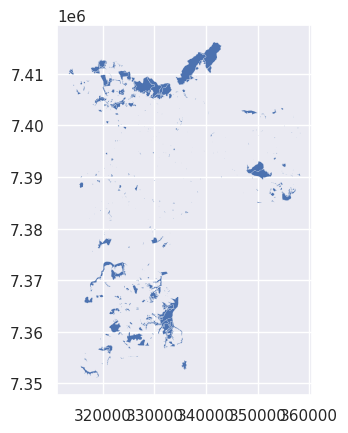

In [22]:
gdf2[setores_faltantes].plot()

Aparentemente o arquivo do censo tem, de fato, setores faltantes. Não lembro de ter lido nada a respeito na documentação do censo, então fico um pouco surpreso. Vamos avaliar outro arquivo para confirmar

In [23]:
df2 = load_asset('basico_digest')
df2

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,355030801000001,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.01,2.32,2091.32,8532451.78,2164.55,8673276.78,1227.41,4285771.99,1713.75,5152087.86
1,355030801000002,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,2.98,2.09,1650.09,3983441.31,1717.44,4030519.99,1045.78,2572133.32,1468.08,2991546.94
2,355030801000003,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.31,3.08,1280.43,5474593.06,2349.53,7553913.02,902.97,2735492.52,1786.79,3837674.74
3,355030801000004,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.16,2.26,1119.59,3572955.10,1859.13,4567289.50,869.09,2122409.02,1567.41,2735383.24
4,355030801000005,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.14,2.35,1416.90,2240207.58,1581.66,2240109.39,917.71,1570047.75,1356.35,1725877.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,355030896000243,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.50,2.61,772.09,168751.10,814.52,143188.21,467.46,191332.48,699.95,123399.08
18359,355030896000244,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.87,2.49,692.50,239941.27,812.93,182516.20,439.33,194034.99,702.10,124952.38
18360,355030896000245,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.90,2.54,630.06,329705.22,843.31,260395.90,347.60,228162.66,767.50,181129.99
18361,355030896000246,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,4.29,4.21,597.37,349101.00,908.00,244391.67,397.76,436942.16,854.20,550319.43


In [24]:
df2[df2['Cod_setor'].str.contains('35503080300006')]

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,...,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
267,355030803000060,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.44,1.72,829.43,168823.79,851.85,154158.60,477.36,220078.32,765.72,131769.90
268,355030803000061,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.56,2.65,839.91,179523.47,889.58,145862.43,481.54,229951.27,808.82,121367.86
269,355030803000066,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,3.60,0.71,652.00,235484.44,931.43,49580.95,447.31,209132.46,830.71,59176.37
270,355030803000067,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,...,4.11,4.14,485.92,229585.23,744.06,158364.19,370.75,246647.23,739.19,219238.96


In [25]:
df['Cod_setor'].compare(df2['Cod_setor'])

,self,other


Aparentemente faltam os mesmo setores. Vamos avaliar a distribuição geográfica dos setores faltantes e presentes

<Axes: >

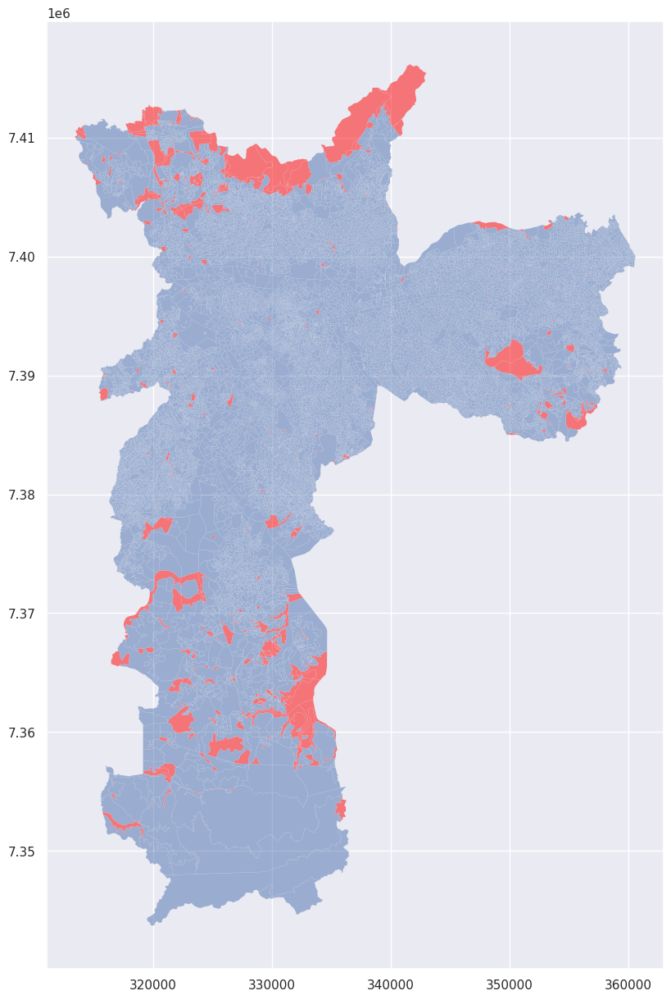

In [26]:
ax = gdf2[setores_faltantes].plot(color='red', alpha=0.5, figsize=(30, 15))
gdf2[~setores_faltantes].plot(alpha=0.5, ax=ax)

A princípio, vou seguir com a análise mantendo os valores nulos, mas futuramente precisaremos definir uma estratégia de tratamento aos valores faltantes

In [27]:
gdf2[gdf2['V003'].isna() & ~gdf2['Cod_setor'].isna()]

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Além das 591 sem equivalência no código do setor censitário, temos também 157 linhas com equivalência, mas sem valores devido à política de privacidade do IBGE.

In [28]:
gdf2['Cod_setor'].duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
18948    False
18949    False
18950    False
18951    False
18952    False
Name: Cod_setor, Length: 18953, dtype: bool

In [29]:
setores_faltantes_suprimidos = gdf2['V003'].isna()

percentual_missing = f"{gdf2[setores_faltantes_suprimidos].shape[0]/gdf2.shape[0]:.2%}"
f'Então, no final, precisaremos tratar os missings de {percentual_missing} dos setores, o que não é muito. O problema, talvez, seja a distribuição geográfica desses setores.'

'Então, no final, precisaremos tratar os missings de 3.94% dos setores, o que não é muito. O problema, talvez, seja a distribuição geográfica desses setores.'

In [30]:
setores_suprimidos = (gdf2['V003'].isna() & ~gdf2['V001'].isna())
f"{gdf2[setores_suprimidos].shape[0]/gdf2.shape[0]:.2%}"

'0.83%'

<Axes: >

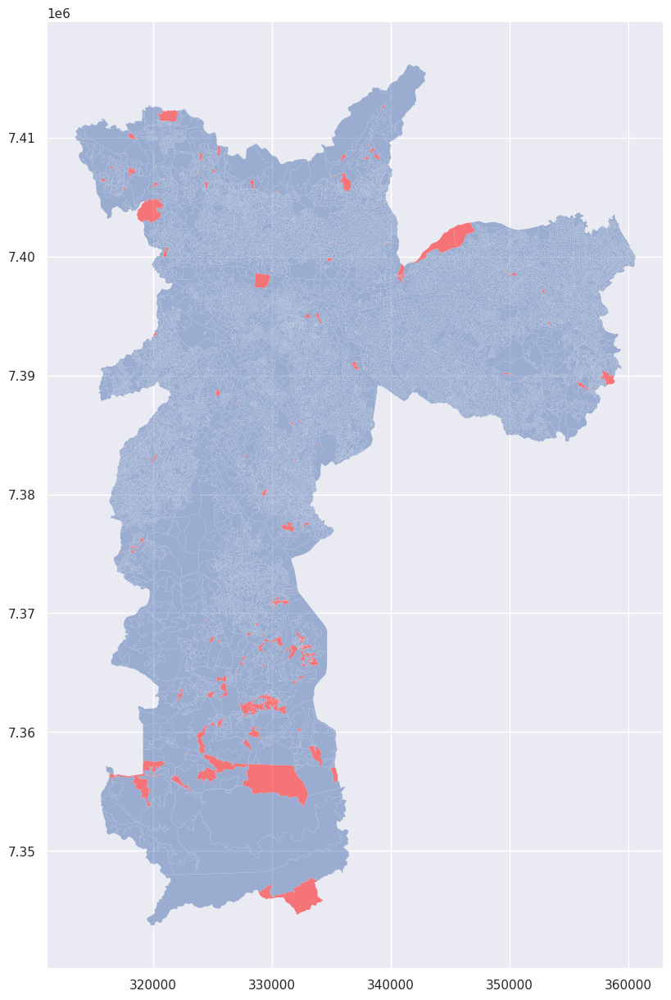

In [31]:
ax = gdf2[setores_suprimidos].plot(color='red', alpha=0.5, figsize=(30, 15))
gdf2[~setores_suprimidos].plot(alpha=0.5, ax=ax)

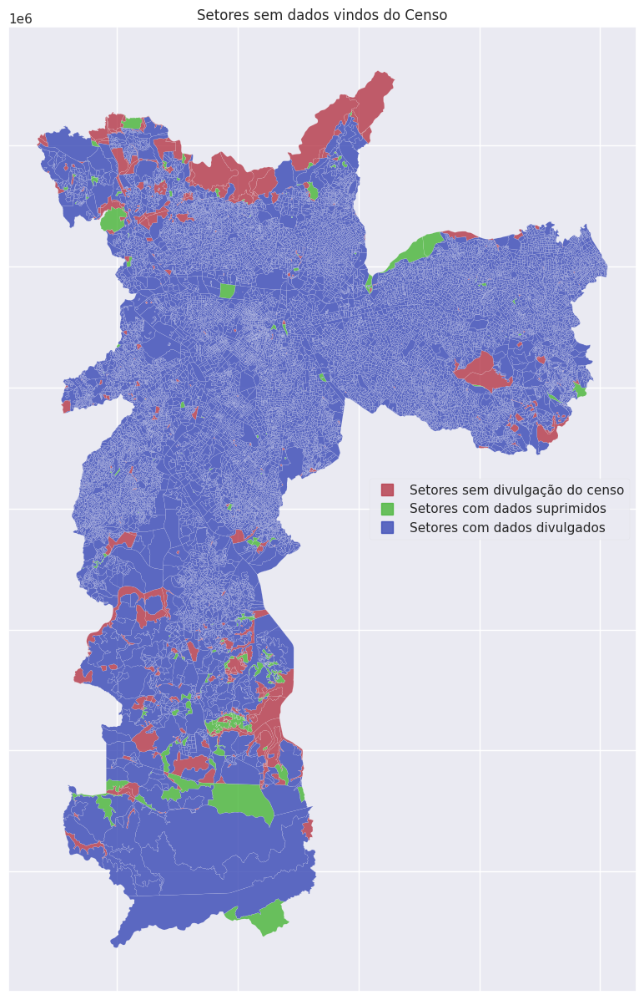

In [32]:
alpha = 0.8

camadas = {
    'faltantes': {'label': 'Setores sem divulgação do censo', 'color': '#B53747'},
    'suprimidos': {'label': 'Setores com dados suprimidos', 'color': '#47B537'},
    'geral': {'label': 'Setores com dados divulgados', 'color': '#3747B5'},
}

ax = gdf2[setores_faltantes].plot(
    color=camadas.get('faltantes').get('color'),
    label=camadas.get('faltantes').get('label'),
    figsize=(30, 15),
    alpha=alpha,
)
gdf2[setores_suprimidos].plot(
    color=camadas.get('suprimidos').get('color'),
    label=camadas.get('suprimidos').get('label'),
    ax=ax,
    alpha=alpha
)
gdf2[~setores_faltantes_suprimidos].plot(
    color=camadas.get('geral').get('color'),
    label=camadas.get('geral').get('label'),
    ax=ax,
    alpha=alpha
)

ax.set_title('Setores sem dados vindos do Censo')

lines = [
    matplotlib.lines.Line2D([0], [0], linestyle="none", marker="s", markersize=10, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_facecolor())
    for t in ax.collections
]

labels = [t.get_label() for t in ax.collections]
ax.legend(lines, labels, loc='center right')
plt.xticks(visible=False)
plt.yticks(visible=False)
plt.show()

In [33]:
represa = load_asset('represa_nivel_maximo')

In [34]:
# massa = load_asset('massa_d_agua')

In [35]:
juquery = load_asset('manancial_juquery')
guarapiranga = load_asset('manancial_guarapiranga')
billings = load_asset('manancial_billings')

In [36]:
area_inundavel = load_asset('area_inundavel')

In [37]:
parque_estadual = load_asset('GEOSAMPA_cadparcs_parque_estadual')

In [38]:
parque_municipal = load_asset('GEOSAMPA_cadparcs_parque_outra_secretaria')

In [39]:
unidade_conservacao_existente = load_asset('GEOSAMPA_cadparcs_unidade_conservacao_existente')

In [40]:
reserva_particular_natural = load_asset('GEOSAMPA_cadparcs_reserva_particular_natural')

In [41]:
area_protecao_apa = load_asset('GEOSAMPA_cadparcs_area_protecao_apa')

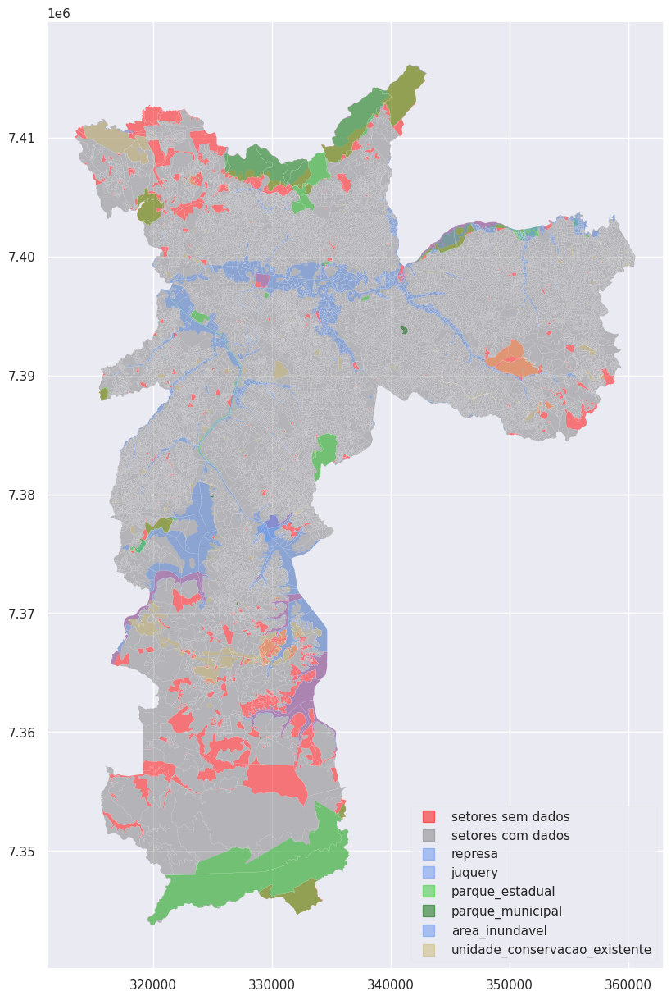

In [42]:
from matplotlib.lines import Line2D

alpha = 0.5
ax = gdf2[setores_faltantes_suprimidos].plot(color='red', alpha=alpha, figsize=(30, 15), label='setores sem dados')
gdf2[~setores_faltantes_suprimidos].plot(alpha=alpha, ax=ax, color='grey', label='setores com dados')

camadas = {
    'represa': {'df': represa, 'color': 'cornflowerblue'},
    # 'massa d\'água': {'df': massa, 'color': 'cornflowerblue'},
    'juquery': {'df': juquery, 'color': 'cornflowerblue'},
    'parque_estadual': {'df': parque_estadual, 'color': 'limegreen'},
    'parque_municipal': {'df': parque_municipal, 'color': 'darkgreen'},
    'area_inundavel': {'df': area_inundavel, 'color': 'cornflowerblue'},
    'unidade_conservacao_existente': {'df': unidade_conservacao_existente, 'color': 'y'},
}

for k, v in camadas.items():
    camada = v.get('df')
    color = v.get('color')
    label = k
    camada.overlay(gdf2, how='intersection').plot(ax=ax, alpha=alpha, color=color, label = label)

lines = [
    Line2D([0], [0], linestyle="none", marker="s", markersize=10, markerfacecolor=t.get_facecolor(), markeredgecolor=t.get_facecolor())
    for t in ax.collections
]
labels = [t.get_label() for t in ax.collections]
ax.legend(lines, labels, loc='lower right')

De fato, houve sobreposição das áreas com dados faltantes e suprimidos com algumas camadas que devem ser utilizadas no modelo final. Vale lembrar na análise final que parte dos resultados da clusterização pode ser consequência da técnica adotada ao tratamento dos missings.

De todo modo, talvez exista realmente alguma relação entre os setores faltantes que justifique o comportamento parecido entre si, que será apenas corroborado pela técnica de clustering.

# Dúvidas finais

1. Agrupar os setores do geosampa fazendo a união dos polígonos é realmente o melhor caminho para resolver a duplicidade de setores nesse dataset?

   Sim. Não é incomum existirem setores censitários "divididos" por outros setores.

2. Tudo bem continuarmos a análise mesmo com a possível não aleatoriedade geográfica dos setores faltantes e suprimidos, lembrando apenas de destacar essa decisão em alguma nota, certo?

   Sim. Os setores sem dados aparentam ser áreas públicas e áreas de preservação, portanto sem domicílios particulares para responderem às questões do censo.

3. O preenchimento dos missings será pela média do entorno mesmo? O filtro é por raio ou por intersection ou os dois?

   Sim. A princípio pela média dos vizinhos imediatos, utilizando um buffer (uma geometria semelhante, mas mais larga do que a original) e filtrando as demais geometrias por intersection.

In [43]:
supri = gdf2[setores_suprimidos]
supri

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
n_supri = gdf2[(~setores_suprimidos) & (~setores_faltantes)]
n_supri

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
0,355030801000001,"POLYGON ((339816.876 7392593.185, 339762.085 7...",355030801000001,1.0,268.0,266.0,203.0,20.0,11.0,136.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,355030801000002,"POLYGON ((339898.791 7392663.965, 339890.991 7...",355030801000002,1.0,306.0,306.0,298.0,8.0,0.0,194.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,355030801000003,"POLYGON ((340010.027 7392443.461, 339999.011 7...",355030801000003,1.0,189.0,189.0,177.0,1.0,7.0,135.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,355030801000004,"POLYGON ((340035.826 7392138.185, 339960.781 7...",355030801000004,1.0,181.0,181.0,154.0,4.0,23.0,76.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,355030801000005,"POLYGON ((339655.092 7392153.506, 339647.532 7...",355030801000005,1.0,240.0,240.0,226.0,1.0,12.0,105.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18948,355030896000243,"POLYGON ((358263.250 7395587.106, 358263.354 7...",355030896000243,1.0,96.0,96.0,96.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18949,355030896000244,"POLYGON ((358308.049 7395452.215, 358307.823 7...",355030896000244,1.0,54.0,54.0,54.0,0.0,0.0,17.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18950,355030896000245,"POLYGON ((354654.416 7398105.552, 354676.451 7...",355030896000245,1.0,87.0,87.0,87.0,0.0,0.0,75.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18951,355030896000246,"POLYGON ((354778.438 7398059.051, 354812.268 7...",355030896000246,1.0,38.0,38.0,38.0,0.0,0.0,34.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
%%time

gdf3 = gdf2.copy()
vars = ['V003', 'V004', 'V005']


for i, row in supri.iterrows():

    buffer = row.geometry.buffer(5)
    prox = n_supri.geometry.intersects(buffer)

    n = n_supri[prox].shape[0]
    if n < 1:
        print('{} vizinhos encontrados para a linha {}'.format(n, i))
    mapper = n_supri[prox][vars].mean().to_dict()
    for col, val in mapper.items():
        gdf3.loc[i, col] = val

0 vizinhos encontrados para a linha 5754
0 vizinhos encontrados para a linha 5759
0 vizinhos encontrados para a linha 11144
0 vizinhos encontrados para a linha 17549
CPU times: user 886 ms, sys: 2.41 ms, total: 889 ms
Wall time: 884 ms


In [46]:
gdf3[setores_suprimidos]

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,206.142857,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,110.142857,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,250.333333,1.000000,0.666667,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,12.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,85.000000,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,148.250000,0.250000,0.250000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,208.000000,0.000000,8.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,67.666667,8.333333,51.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,207.200000,10.600000,66.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
gdf3.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18953 entries, 0 to 18952
Columns: 245 entries, cd_original_setor_censitario to V241
dtypes: float64(242), geometry(1), object(2)
memory usage: 35.4+ MB


Apesar de ter dado certo na maioria dos casos, existem alguns setores sem vizinhos imediatos com dados para servirem de referência para as médias.


In [48]:
nao_preenchidos = (setores_suprimidos) & (gdf3['V003'].isna())
gdf3[nao_preenchidos]

,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
5754,355030830000546,"POLYGON ((329774.473 7362188.357, 329746.270 7...",355030830000546,8.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5759,355030830000551,"POLYGON ((328166.028 7362023.650, 328175.645 7...",355030830000551,8.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11144,355030855000311,"POLYGON ((332468.933 7360381.516, 332460.249 7...",355030855000311,8.0,2.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17549,355030889000179,"POLYGON ((340648.730 7398414.278, 340648.837 7...",355030889000179,1.0,21.0,21.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Vamos investigar visualmente esses 4 setores. Para facilitar a exploração, vou utilizar a biblioteca folium, que permite que o mapa seja interativo.

Primeiro, inicio um mapa centrado no edifício Matarazzo.

In [49]:
import folium

map = folium.Map(location=[-23.5475, -46.6375],
                 tiles="CartoDB Positron",
                )
map

In [50]:
# Para facilitar a edição, defino a tolerância de simplificação das geometrias
simpification_tolerance = 10**-6

Como o folium trabalha apenas na projeção `EPSG4326`, criarei um novo geodataframe convertido para utilizar nos próximos mapas

In [51]:
gdf4 = gdf3.copy().to_crs(epsg=4326)

Primeiro, adicionarei o contorno geral dos setores censitários para servir de base

In [52]:
sim_geo = gpd.GeoSeries(gdf4["geometry"].unary_union).set_crs(epsg=4326).simplify(tolerance=simpification_tolerance)
geo_j = sim_geo.to_json()
geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {'color': 'navy', 'fillOpacity': 0})
geo_j.add_to(map)
map.fit_bounds(map.get_bounds())
map

Agora, adiciono os setores ***com dados***, numa margem maior do que a usada anteriormente, para cada setor sem vizinhos imediados

In [53]:
for _, setor in gdf4[nao_preenchidos].to_crs(epsg=31983).iterrows():
    buffer = setor['geometry'].buffer(1000)
    inter = gdf4[(~setores_suprimidos) & (~setores_faltantes)]['geometry'].to_crs(epsg=31983).intersects(buffer)
    clipped = gdf4[(~setores_suprimidos) & (~setores_faltantes)]
    clipped = clipped[inter]
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(clipped["geometry"]).simplify(tolerance=simpification_tolerance)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {'color': 'navy', 'fillColor': 'navy'})
    folium.Popup(clipped["cd_original_setor_censitario"]).add_to(geo_j)
    geo_j.add_to(map)
map

Agora, repito o mesmo processo para setores ***sem dados*** (parques, reservas, etc.)

In [54]:
for _, setor in gdf4[nao_preenchidos].to_crs(epsg=31983).iterrows():
    buffer = setor['geometry'].buffer(1000)
    inter = gdf4[setores_faltantes]['geometry'].to_crs(epsg=31983).intersects(buffer)
    clipped = gdf4[setores_faltantes]
    clipped = clipped[inter]
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(clipped["geometry"]).simplify(tolerance=simpification_tolerance)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {'color': 'orange', 'fillColor': 'orange'})
    folium.Popup(clipped["cd_original_setor_censitario"]).add_to(geo_j)
    geo_j.add_to(map)
map

Agora, repito o mesmo processo para os demais setores ***com dados suprimidos dados*** no entorno dos setores sem vizinhos imediatos

In [55]:
for _, setor in gdf4[nao_preenchidos].to_crs(epsg=31983).iterrows():
    buffer = setor['geometry'].buffer(1000)
    inter = gdf4[setores_suprimidos]['geometry'].to_crs(epsg=31983).intersects(buffer)
    clipped = gdf4[setores_suprimidos]
    clipped = clipped[inter]
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(clipped["geometry"]).simplify(tolerance=simpification_tolerance)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {'color': 'pink', 'fillColor': 'pink'})
    folium.Popup(clipped["cd_original_setor_censitario"]).add_to(geo_j)
    geo_j.add_to(map)
map

Finalmente, adiciono os setores sem vizinhos imediatos

In [56]:
for _, r in gdf4[nao_preenchidos].iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r["geometry"]).simplify(tolerance=simpification_tolerance)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {'color': 'red', 'fillColor': 'red'})
    folium.Popup(r["cd_original_setor_censitario"]).add_to(geo_j)
    geo_j.add_to(map)
map

De fato, os setores sem dados inseridos possuem como vizinhos imediatos apenas setores sem dados ou outros setores com dados suprimidos. Daqui, podemos aumentar o buffer para pegar vizinhos não imediatos ou mudar a metodologia para k-ésimos vizinhos mais próximos. Vou testar algumas medidas de buffer para avaliar qual o menor valor de buffer para que esses setores tenham vizinhos. Para registro, o buffer utilizado atualmente é de 5 metros.

In [57]:
gdf5 = gdf2.copy()
vars = ['V003', 'V004', 'V005']


for i, row in supri.iterrows():

    buffer = row.geometry.buffer(517)
    prox = n_supri.geometry.intersects(buffer)

    n = n_supri[prox].shape[0]
    if n < 1:
        print('{} vizinhos encontrados para a linha {}'.format(n, i))
    mapper = n_supri[prox][vars].mean().to_dict()
    for col, val in mapper.items():
        gdf5.loc[i, col] = val

O buffer mínimo para que todos os setores tenham ao menos 1 vizinho é de 517 metros. Vamos avaliar se as médias das variáveis diferiram muito das médias calculadas com um buffer de 5 metros.

<Axes: >

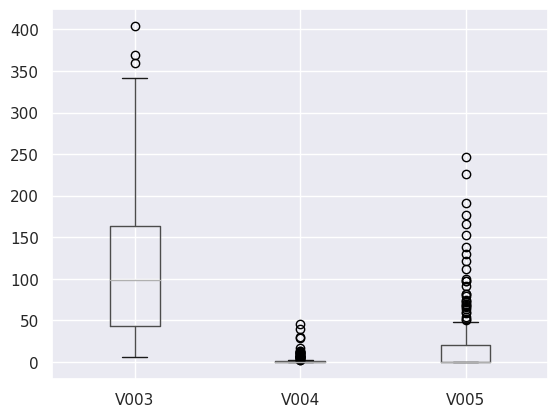

In [58]:
gdf3[setores_suprimidos][vars].boxplot()

<Axes: >

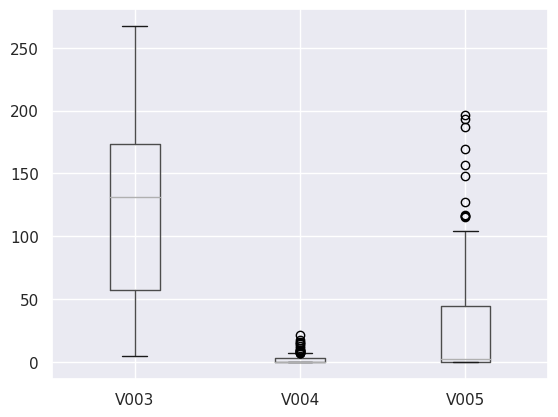

In [59]:
gdf5[setores_suprimidos][vars].boxplot()

Visualmente parece haver bastante diferença. Vamos confirmar numericamente.

In [60]:
gdf3[setores_suprimidos][vars].describe()

,V003,V004,V005
count,153.000000,153.000000,153.000000
mean,115.708695,2.497846,22.823288
std,86.587045,6.516295,46.892247
min,6.000000,0.000000,0.000000
25%,43.500000,0.000000,0.000000
50%,99.000000,0.000000,0.333333
75%,163.000000,1.000000,20.000000
max,404.000000,45.333333,246.000000


In [61]:
gdf5[setores_suprimidos][vars].describe()

,V003,V004,V005
count,157.000000,157.000000,157.000000
mean,120.117486,2.267446,27.469086
std,64.783174,3.824383,44.210103
min,5.000000,0.000000,0.000000
25%,57.375000,0.000000,0.333333
50%,131.090909,0.294118,2.000000
75%,173.523810,2.800000,44.722222
max,267.304348,21.379310,196.394737


In [62]:
(gdf3[setores_suprimidos][vars].describe()-gdf5[setores_suprimidos][vars].describe())/gdf3[setores_suprimidos][vars].describe()

,V003,V004,V005
count,-0.026144,-0.026144,-0.026144
mean,-0.038102,0.092240,-0.203555
std,0.251814,0.413105,0.057198
min,0.166667,NaN,NaN
25%,-0.318966,NaN,-inf
50%,-0.324151,-inf,-5.000000
75%,-0.064563,-1.800000,-1.236111
max,0.338356,0.528398,0.201647


Algumas médias diferiram bastante (9% e -20%), e principalmente as medianas tiverem bastante variação. Vou testar o cálculo da média por k-ésimos vizinhos para ver como as variáveis se comportam.

Primeiro, tento uma implementação semelhante à baseada em buffer.

In [63]:
%%time

gdf6 = gdf2.copy()
vars = ['V003', 'V004', 'V005']
k = 3

for i, row in supri.iterrows():

    aux_df = n_supri.copy()
    aux_df['dist'] = aux_df.distance(row['geometry'])
    aux_df = aux_df.sort_values('dist')
    aux_df = aux_df.iloc[:k]
    media_distancia = aux_df['dist'].mean()
    dists[row['cd_original_setor_censitario']] = media_distancia
    
    mapper = aux_df[vars].mean().to_dict()
    for col, val in mapper.items():
        gdf6.loc[i, col] = val
        
gdf6.loc[gdf6.index.isin(supri.index)]

CPU times: user 53.5 s, sys: 1.14 s, total: 54.6 s
Wall time: 54.6 s


,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,266.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,144.333333,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,250.333333,1.000000,0.666667,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,12.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,85.000000,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,106.333333,0.000000,0.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,105.666667,0.333333,15.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,67.666667,8.333333,51.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,171.333333,13.666667,44.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Como o tempo de execução está relativamente alto, tento uma segunda implementação, com poucas alterações, mas ligeiramente mais legível.

In [64]:
%%time

gdf7 = gdf2.copy()
vars = ['V003', 'V004', 'V005']
k = 3

for i, row in supri.iterrows():
    
    aux_df = n_supri.copy()
    aux_df['dist'] = aux_df.distance(row['geometry'])
    aux_df = aux_df.sort_values('dist')
    
    gdf7.loc[i, vars] = aux_df.iloc[:k][vars].mean()
    
gdf7.loc[gdf7.index.isin(supri.index)]

CPU times: user 55.7 s, sys: 1.16 s, total: 56.9 s
Wall time: 56.9 s


,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,266.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,144.333333,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,250.333333,1.000000,0.666667,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,12.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,85.000000,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,106.333333,0.000000,0.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,105.666667,0.333333,15.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,67.666667,8.333333,51.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,171.333333,13.666667,44.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


O tempo de execução permanece igual, então tentarei uma implementação baseada no método `pd.DataFrame.apply`.

In [65]:
def mean_by_k_nearest(row, neighbours, k, vars):
    vars.append('geometry')
    aux_df = neighbours.loc[:, vars].copy()
    aux_df['dist'] = aux_df.distance(row['geometry'])
    aux_df = aux_df.sort_values('dist')
    aux_df = aux_df.iloc[:k]

    vars.remove('geometry')
    row.loc[vars] = aux_df[vars].mean()
    return row

In [66]:
%%time

gdf8 = gdf2.copy()
vars = ['V003', 'V004', 'V005']
k = 3

gdf8.loc[gdf8.index.isin(supri.index)] = gdf8.loc[gdf8.index.isin(supri.index)].apply(lambda r: mean_by_k_nearest(r, n_supri, k, vars), axis=1)
gdf8.loc[gdf8.index.isin(supri.index)]

CPU times: user 51.3 s, sys: 68.3 ms, total: 51.4 s
Wall time: 51.4 s


,cd_original_setor_censitario,geometry,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
242,355030803000034,"POLYGON ((318484.812 7407203.854, 318471.825 7...",355030803000034,8.0,3.0,2.0,266.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
251,355030803000043,"POLYGON ((318398.193 7406926.772, 318391.359 7...",355030803000043,8.0,4.0,4.0,144.333333,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
252,355030803000044,"POLYGON ((316329.421 7407668.337, 316368.062 7...",355030803000044,8.0,2.0,2.0,250.333333,1.000000,0.666667,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
279,355030803000071,"POLYGON ((318491.399 7409878.448, 318479.538 7...",355030803000071,2.0,1.0,1.0,12.666667,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
293,355030803000085,"POLYGON ((316671.510 7405149.798, 316601.107 7...",355030803000085,2.0,4.0,4.0,85.000000,0.000000,0.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18115,355030892000188,"POLYGON ((339858.030 7401112.146, 339844.700 7...",355030892000188,1.0,4.0,4.0,106.333333,0.000000,0.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18463,355030894000153,"POLYGON ((321058.275 7390390.628, 321055.135 7...",355030894000153,1.0,10.0,10.0,105.666667,0.333333,15.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18578,355030894000268,"POLYGON ((322278.526 7389008.950, 322306.889 7...",355030894000268,1.0,3.0,3.0,67.666667,8.333333,51.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18667,355030895000087,"POLYGON ((320953.939 7402330.591, 320951.245 7...",355030895000087,2.0,2.0,2.0,171.333333,13.666667,44.333333,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


O tempo de execução permaneceu no mesmo patamar, então utilizarei a segunda implementação, pela legibilidade.

Agora, avalio se todos os valores foram preenchidos.

In [67]:
gdf7.loc[~setores_faltantes, vars].isna().sum()

V003    0
V004    0
V005    0
dtype: int64

Todas as variáveis foram preenchidas a contento. Vamos avaliar como ficaram as distribuições, usando o buffer de 5 metros como comparação.

<Axes: >

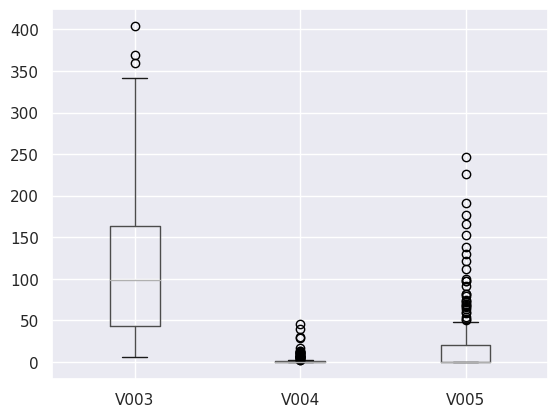

In [68]:
gdf3[setores_suprimidos][vars].boxplot()

<Axes: >

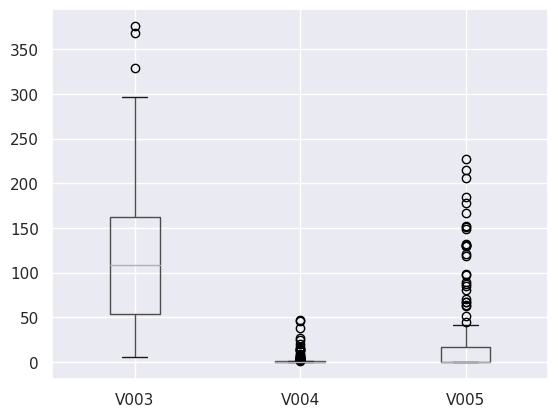

In [69]:
gdf7[setores_suprimidos][vars].boxplot()

In [70]:
gdf3[setores_suprimidos][vars].describe()

,V003,V004,V005
count,153.000000,153.000000,153.000000
mean,115.708695,2.497846,22.823288
std,86.587045,6.516295,46.892247
min,6.000000,0.000000,0.000000
25%,43.500000,0.000000,0.000000
50%,99.000000,0.000000,0.333333
75%,163.000000,1.000000,20.000000
max,404.000000,45.333333,246.000000


In [71]:
gdf7[setores_suprimidos][vars].describe()

,V003,V004,V005
count,157.000000,157.000000,157.000000
mean,115.577495,2.426752,25.029724
std,77.719319,7.212765,50.786568
min,5.666667,0.000000,0.000000
25%,54.000000,0.000000,0.000000
50%,108.333333,0.000000,0.333333
75%,162.333333,0.666667,17.333333
max,376.000000,47.333333,226.666667


In [72]:
(gdf3[setores_suprimidos][vars].describe()-gdf7[setores_suprimidos][vars].describe())/gdf3[setores_suprimidos][vars].describe()

,V003,V004,V005
count,-0.026144,-0.026144,-0.026144
mean,0.001134,0.028462,-0.096675
std,0.102414,-0.106881,-0.083048
min,0.055556,NaN,NaN
25%,-0.241379,NaN,NaN
50%,-0.094276,NaN,0.000000
75%,0.004090,0.333333,0.133333
max,0.069307,-0.044118,0.078591


Com exceção do primeiro quartil da variável `V001`, as estatísticas ficaram bastante próximos, com poucas diferindo entre 10-15%, e a maioria diferindo menos de 10%.

Vamos comparar com os resultados ao aumentar o buffer.

In [73]:
(gdf3[setores_suprimidos][vars].describe()-gdf5[setores_suprimidos][vars].describe())/gdf3[setores_suprimidos][vars].describe()

,V003,V004,V005
count,-0.026144,-0.026144,-0.026144
mean,-0.038102,0.092240,-0.203555
std,0.251814,0.413105,0.057198
min,0.166667,NaN,NaN
25%,-0.318966,NaN,-inf
50%,-0.324151,-inf,-5.000000
75%,-0.064563,-1.800000,-1.236111
max,0.338356,0.528398,0.201647


Todas as estatísticas disponíveis na tabela estão mais próximas do buffer de 5 metros pelo método de k-ésimos vizinhos mais próximos. Assumindo que o buffer de 5 metros fornece o valor que desejado, mas não é aplicável a todos os setores, optarei por utilizar o método de k-ésimos vizinhos mais próximos.